In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
import PIL
from PIL import Image, ImageFilter
import scipy
import scipy.sparse 
import scipy.sparse.linalg

In [2]:
im = Image.open("test.png")
im = im.resize((2701, 1401))
# im.show()
im = np.asarray(im)
im.shape

(1401, 2701, 3)

In [3]:
Lx, Ly = im.shape[0] - 1, im.shape[1] - 1
Nx, Ny = int(Lx / 25), int(Ly / 25)
T = 1
Nt = 500
a = 1000

x_mesh = np.linspace(0, Lx, Nx + 1)
dx_mesh = x_mesh[1] - x_mesh[0]
y_mesh = np.linspace(0, Ly, Ny + 1)
dy_mesh = y_mesh[1] - y_mesh[0]
t_mesh = np.linspace(0, T, Nt + 1)
dt_mesh = t_mesh[1] - t_mesh[0]
Fx = a * dt_mesh / dx_mesh ** 2
Fy = a * dt_mesh / dy_mesh ** 2

Fx, Fy, dx_mesh, dy_mesh

(0.0032, 0.0032, 25.0, 25.0)

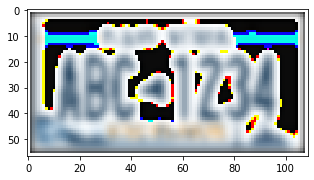

In [13]:
%matplotlib inline
from IPython.display import HTML

anim_len = 10000
anim_interval = anim_len / Nt

# generate figure
fig = plt.figure()
ax = plt.subplot(1, 1, 1)
fig.subplots_adjust(left=0.25, bottom=0.25)

# display image
im = ax.imshow((u[..., 0] * 254).astype(np.uint8), interpolation='nearest')

def animate(i):
    im.set_data((u[..., i] * 254).astype(np.uint8))
    fig.canvas.draw()
    return im,

anim = animation.FuncAnimation(fig, animate, frames=Nt, interval=anim_interval, blit=True)
HTML(anim.to_jshtml())

In [4]:
u = np.zeros((Nx + 1, Ny + 1, 3, Nt + 1))
for i, x in enumerate(x_mesh):
    for j, y in enumerate(y_mesh):
        u[i, j, :, 0] = im[int(x), int(y), :] / 255

In [5]:
# Data structures for the linear system
b = np.zeros((Nx + 1, Ny + 1, 3))
A = [np.zeros((Nx + 1, Ny + 1, Nx + 1, Ny + 1), dtype=np.float16) for _ in range(3)]

for c in range(3):
    for x in range(1, Nx):
        for y in range(1, Ny):
            A[c][x, y, x, y] = 2 * Fx + 2 * Fy + 1
            A[c][[x + 1, x - 1], y, x, y] = -Fx
            A[c][x, [y + 1, y - 1], x, y] = -Fy

for c in range(3):
    A[c][0, :, 1, :] = 0
    A[c][:, 0, :, 1] = 0
    A[c][Nx, :, Nx - 1, :] = 0
    A[c][:, Ny, :, Ny - 1] = 0

    for x in range(Nx + 1):
        A[c][x, 0, x, 0] = 1
        A[c][x, Ny, x, Ny] = 1
    for y in range(Ny + 1):
        A[c][0, y, 0, y] = 1
        A[c][Nx, y, Nx, y] = 1

A = [A[c].reshape((Nx + 1) * (Ny + 1), (Nx + 1) * (Ny + 1)) for c in range(3)]
A = [scipy.sparse.csr_matrix(A[c]) for c in range(3)]

In [6]:
for c in range(3):
    for t in range(1, Nt):
        # Compute b and solve linear system
        u[:, :, c, t] = scipy.sparse.linalg.spsolve(A[c], u[:, :, c, t - 1].flatten()).reshape(Nx + 1, Ny + 1)


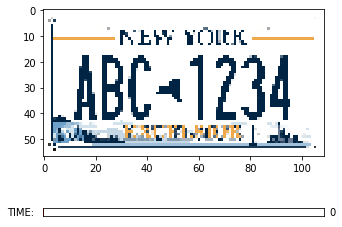

In [14]:
# generate figure
fig = plt.figure()
ax = plt.subplot(1, 1, 1)
fig.subplots_adjust(left=0.25, bottom=0.25)

# display image
im = ax.imshow(u[..., 0], interpolation='nearest')

# define slider
ax = fig.add_axes([0.25, 0.1, 0.65, 0.03])
slider = Slider(ax, "TIME: ", 0, Nt, valinit=0, valfmt='%i')

def update(val):
    im.set_data(u[..., int(slider.val)])
    fig.canvas.draw()

slider.on_changed(update)

plt.show()


In [11]:
noise_filter = Image.effect_noise((1401, 2701), 128)
noise_filter.show()

In [7]:
im = Image.open("test.png")
im = im.effect_noise()
im.show()

AttributeError: effect_noise